# Проектная работа: Pынок заведений общественного питания Москвы


Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

В ходе проекта мы будем работать с файлом `moscow_places.csv`, который содержит информаци о заведениях Москвы:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 - «Средний счёт: 1000–1500 ₽»;
 - «Цена чашки капучино: 130–220 ₽»;
 - «Цена бокала пива: 400–600 ₽».
  и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

**План работы**: Изучим данные и проведем предобработку. Затем проанализируем районы и заведения, выявим закономерности и взаимосвязи. Далее детализируем исследования для заказчиков «Shut Up and Take My Money», рассмотрим рентабельность открытия кофейни. Результаты исследования оформим в презентацию.

## Обзор данных

In [1]:
#pip install folium

In [2]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json
import folium
import warnings
from IPython.display import display
from plotly import graph_objects as go
from folium import Marker, Map
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth
from folium.features import CustomIcon

In [3]:
try:
    moscow_places = pd.read_csv('moscow_places.csv')
except Exception:
    moscow_places = pd.read_csv('/datasets/moscow_places.csv')

display(moscow_places)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
print(f'Количество представленных заведений: ', moscow_places['name'].nunique())

Количество представленных заведений:  5614


Мы имеем датафрейм, в котором содержится информация о 8 406 заведениях Москвы. Всего уникальных заведений 5 614, что говорит нам о том что в датасете так же представлены сетевые кафе и рестораны. Типы данных в столбцах соответсвуют их содержанию: стороковые значения преведены к типу object, целые числа к типу int64, а дробные к типу float64.

## Предобработка данных

#### Проверим наличие пропусков и дубликатов в данных.

In [6]:
def pass_value_barh(df):
    (
        (df.isna().mean()*100)
        .to_frame()
        .rename(columns = {0:'space'})
        .query('space > 0')
        .sort_values(by = 'space', ascending = True)
        .plot(kind= 'barh', figsize=(19,6), legend = False, fontsize = 16)
        .set_title('Пропуски в столбцах' + "\n", fontsize = 22, color = 'SteelBlue')    
    );  

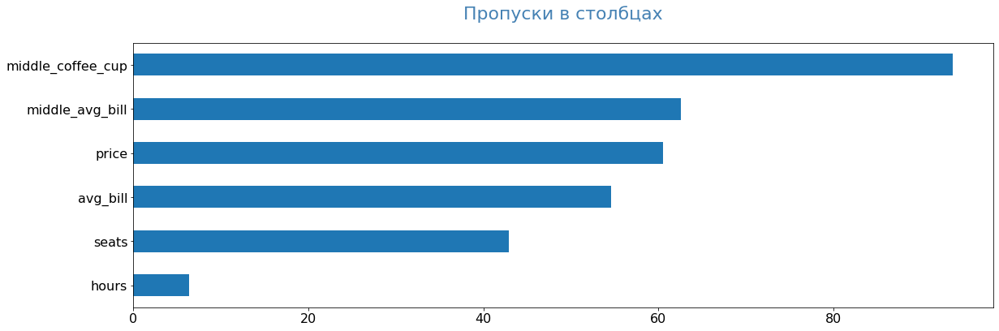

In [7]:
pass_value_barh(moscow_places)

Мы видим что в некоторых столбцах есть пропуски. Больше всего пропцсков в столбце `middle_coffee_cup`, так же есть пропуски в `middle_avg_bill`, `price`, `avg_bill`, `hours` и `seats`. Мы не можем заполнить пропущенные значение самостоятельно, так как в случае с большим количеством пропусков это может исказить результаты исследования, а с лучае столбца с временем работы заведения получить медианное значение мы не можем.

In [8]:
moscow_places[moscow_places.duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [9]:
moscow_places['address'] = moscow_places['address'].str.lower()
moscow_places['address'] = moscow_places['address'].replace('"', '').replace('`', '').replace('^', '').replace('«', '').replace('»', '')
moscow_places['address'] = moscow_places['address'].str.strip()

In [10]:
moscow_places[moscow_places.duplicated(subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,Кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


In [11]:
moscow_places.query('name == "Кафе" & address =="москва, парк ангарские пруды"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,Кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,Кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


In [12]:
moscow_places = moscow_places.drop_duplicates(subset=['name', 'address'])
display(moscow_places)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Обнаружили одну дублирующую строчку, в которой отличается время работы заведения. Так как точное время работы мы не знаем, а разница незначительная, удалим дублирующую строку.

#### Создадим столбец `street` с названиями улиц из столбца с адресом для удобства дальнейшей работы.

In [13]:
def street_extraction(address):
    street = address.split(',')
    return street[1].strip()

In [14]:
moscow_places['street'] = moscow_places['address'].apply(street_extraction)
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


#### Добавим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно.

In [15]:
def all_day(hours):
    if hours is np.NaN:
        return np.NaN
    elif 'ежедневно' in hours and 'круглосуточно' in hours:
        return True
    else:
        return False

In [16]:
moscow_places['is_24/7'] = moscow_places['hours'].apply(all_day)
moscow_places

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,Миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,Самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,Чайхана Sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


## Анализ данных

#### Рассмотрим, какие категории заведений представлены в датасете.

In [17]:
df_category = pd.DataFrame(moscow_places['category'].value_counts()).reset_index()
df_category

,index,category
0,кафе,2377
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [18]:
fig = go.Figure(data=[go.Pie(labels=df_category['index'],
                             values=df_category['category'],
                             pull = [0.1, 0])]) 
fig.update_layout(title='Число заведений по категориям',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show()

Наибольшее количество заведений в категории кафе: всего 2 378. Далее по убыванию идут рестораны и кофейни: 2 043 и 1413 заведений соответственно. Меньше всего представлено булочных и столовых.

In [19]:
fig = px.bar(df_category, x='index', y='category', title='Число заведений по категориям')
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений')
fig.show() 

#### Рассмотрим количество посадочных мест в заведениях разных категорий. 

Для анализа возмем медианные значения, чтобы крупные заведения не искажали картину.

In [20]:
df_seats = pd.DataFrame(moscow_places.groupby('category')['seats'].median()).reset_index()
df_seats = df_seats.rename(columns={'seats':'median_seats'})
df_seats

,category,median_seats
0,"бар,паб",82.5
1,булочная,50.0
2,быстрое питание,65.0
3,кафе,60.0
4,кофейня,80.0
5,пиццерия,55.0
6,ресторан,86.0
7,столовая,75.5


In [21]:
fig = px.bar(df_seats.sort_values(by='median_seats', ascending=True), 
             x='median_seats', 
             y='category', 
             text='median_seats' 
            )

fig.update_layout(title='Медианное количество посадочных мест по категориям заведений',
                   xaxis_title='Медианное количество посадочных мест',
                   yaxis_title='Категория заведения')
fig.show() 

Наибольшее медианное количество посадочных мест приходится на рестораны. За ними идут бары, пабы и кофейни. Наименьшее число мест в булочных, что кажется логичным, ведь в таких заведениях как правило большой поток клиентов и быстрое обслуживание, в связи с чем места быстро освобождаются.

#### Рассмотрим соотношение сетевых и несетевых заведений.

In [22]:
df_ch = moscow_places['chain'].value_counts().reset_index()
dictionary = {0: "Несетевые", 1: "Сетевые"}
df_ch = df_ch.replace({"index": dictionary})

In [23]:
fig = go.Figure(data=[go.Pie(labels=df_ch['index'],
                             values=df_ch['chain'])]) 
fig.update_layout(title='Cоотношение сетевых и несетевых заведений',
                  width=800,
                  height=600,
                  annotations=[dict(x=1,
                                    y=1,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show()

Сетевых заведени заведений в датасете всего 38%, большинство приходится все таки на несетевые.

#### Узнаем какие категории заведений чаще являются сетевыми

In [24]:
chain_ratio = moscow_places.groupby('category', as_index=False).agg ({'chain':['count', 'sum']})
chain_ratio.columns = ['category', 'total', 'chain']
chain_ratio['chain_ratio'] = chain_ratio['chain'] / chain_ratio['total']
chain_ratio['non-chain_ratio'] = 1 - chain_ratio['chain_ratio']
chain_ratio

,category,total,chain,chain_ratio,non-chain_ratio
0,"бар,паб",765,169,0.220915,0.779085
1,булочная,256,157,0.613281,0.386719
2,быстрое питание,603,232,0.384743,0.615257
3,кафе,2377,779,0.327724,0.672276
4,кофейня,1413,720,0.509554,0.490446
5,пиццерия,633,330,0.521327,0.478673
6,ресторан,2043,730,0.357318,0.642682
7,столовая,315,88,0.279365,0.720635


In [25]:
fig = go.Figure(data=[
    go.Bar(name='сетевые', x=chain_ratio.category, y=chain_ratio.chain_ratio, text=chain_ratio.chain_ratio),
    go.Bar(name='несетевые', x=chain_ratio.category, y=chain_ratio['non-chain_ratio'], text=chain_ratio['non-chain_ratio'])
])


fig.update_layout(title='Соотношение сетевых / несетевых заведений заведений по категориям', barmode='stack',
                  yaxis=dict(showticklabels= False),
                  xaxis=dict(categoryorder='array', 
                             categoryarray=chain_ratio.sort_values(by='non-chain_ratio').category),
                  legend=dict(orientation='h'
))
fig.update_traces(texttemplate='%{text:.0%}', hovertemplate='%{label} %{text:.0%}')

fig.show()

Несетевыми чаще всего являются кафе, рестораны, бары, пабы, столовые, а так жезаведения быстрого питания. В частности количество несетевых заведение в два раза и более превышает количество сетевых среди кафе, рестранов, баров и пабов. Преимущественно сетевыми являются категории булочные, пиццерии и кофейни. Но соотношение в данных случаях почти равномерное, и разница в значениях небольшая.

#### Найдем топ-15 популярных сетей в Москве

In [26]:
chain_places = pd.DataFrame(moscow_places.query('chain == 1').groupby('name')['address'].count().reset_index().sort_values('address', ascending=False).head(15))
chain_places = chain_places.rename(columns={'address':'count'})
chain_places

,name,count
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


In [27]:
fig = px.bar(chain_places.sort_values(by='count', ascending=True), 
             x='count', 
             y='name', 
             text='count' 
            )

fig.update_layout(title='Топ-15 крупных сетевых заведений Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show()

Большинство сетей в топе знакомы многим, так как являются федеральными и присутствуют во многих городах России. С большим отрывом среди сетей лидирует Шоколадница. На последнем места топа отказалась сеть рестораном «Му-му».

Посмотрим на распределение категрий этих заведений по районам Москвы.

In [28]:
top_15_list = chain_places['name']
data_top_15 = moscow_places.query('name in @top_15_list')
area_of_top15 = data_top_15.groupby(['district','category'])['address'].count().reset_index().sort_values('address', ascending=False)
fig = px.bar(area_of_top15, x="district", y="address", color="category")
fig.update_layout(title="Распределение категорий топ-15 заведений по районам",
                  legend_title_text='Категории',
                  xaxis_title="Районы",
                  yaxis_title="Количество заведений",
                  barmode='stack', xaxis={'categoryorder':'total descending'})

fig.show()

Большинство заведений расположено в Центральном районе, так же в нем расположена наибольшая доля кофеен, ресторанов и кафе. А вот доля пицерий и булочных заметно меньше, чем в других районах. Меньше всего заведений из топа в Северо-Западном административном округе.

#### Посмотрим на общее распределение категорий заведений по районам

In [29]:
df_address = moscow_places.groupby(['district','category'])['address'].count().reset_index().sort_values('address', ascending=False)
df_address
                                                                                                         

,district,category,address
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [30]:
df_address = moscow_places.groupby(['district','category'])['address'].count().reset_index().sort_values('address', ascending=False)
fig = px.bar(df_address, x="district", y="address", color="category")
fig.update_layout(legend=dict(y=0.5),
                  legend_title_text='Категории',
                  title="Распределение категорий заведений по районам",
                  xaxis_title="Районы",
                  yaxis_title="Количество заведений",
                 barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()


На общем дататсете по количеству заведений так же лидирует Центральный район. А вот распределение по категориям немного изменилось. Больше всего в Центральном районе ресторанов, затем по убыванию кафе и кофейни. Меньше всего столовых и булоных. Баров и пабов в центре сильно больше, чем в других районах. Наименьшее количество заведений приходится на Северо-Западный административный округ. Во всех районах, кроме Центрального, заведений категории кафе больше чем ресторанов.

#### Рассмотрим средние рейтинги заведений по категориям

In [31]:
category_rating = moscow_places.groupby('category')['rating'].mean().round(2).reset_index().sort_values('rating', ascending=False)
category_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [32]:
fig = px.bar(category_rating, x="category", y="rating")
fig.show()

Сильных различий в среднем рейтенге по категориям нет. Наименьший средний рейтинг у заведений категрии кафе и быстрого питания. Наивысший у баров и пабов.

#### Посмотрим на распределение средних рейтингов заведений по районам 

Для наглядности построим фоновую картограмму.

In [33]:
rating_df = moscow_places.groupby('district', as_index=False)['rating'].agg('mean')
rating_df['rating'] = rating_df['rating'].round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [34]:
try:
    state_geo = 'admin_level_geomap.geojson'
except Exception:
    state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Самые высокие рейтинги у заведений в Центральном районе, за ним Северный административный округ и Северо-Западный. Самые низкие в  Юго-Восточном и Северо-Восточном административных округах. В остальных районах рейтинг 4,15 - 4,19.

#### Нанесем всез заведения датасета на карту Москвы

In [35]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

moscow_places.apply(create_clusters, axis=1)
m

#### Найдем топ-15 улиц по количеству заведений

Рассмотрим как на них распеределены категории

In [36]:
top15_street = moscow_places.groupby('street')['name'].count().reset_index().sort_values('name', ascending=False).head(15)
top15_street

,street,name
837,проспект мира,184
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [37]:
top15_list = top15_street['street']
data_top15_srteet = moscow_places.query('street in @top15_list')
top15_street_category = data_top15_srteet.groupby(['street', 'category'])['name'].count().reset_index().sort_values('name', ascending=False)

In [38]:
fig = px.bar(top15_street_category, x="street", y="name", color="category")
fig.update_layout(legend=dict(y=0.5),
                  legend_title_text='Категории',
                  title="Распределение категорий заведений по топ-15 улицам",
                  xaxis_title="Улицы",
                  yaxis_title="Количество заведений",
                 barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Самая популярная по количеству заведений улица: проспект Мира. На ней расположено больше всего кафе, ресторанов и кофеен. Самой барной улицей оказался Ленинградский проспект, а пиццерий больше всего на Профсоюзной улице.Меньше всего заведений на Пятницкой улице.

#### Найдем улицы, на которых расположено только одно заведение общепита

In [39]:
lonely_cafe = moscow_places.groupby('street')['name'].count().reset_index().query('name == 1')
lonely_cafe_list = lonely_cafe['street']
df_of_lonely_cafe = moscow_places.query('street in @lonely_cafe_list')
display(df_of_lonely_cafe)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,В парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,Coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
60,Чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица шкулёва,False
8294,WTFcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица артюхиной,False
8317,Беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,кузьминская улица,False
8379,Лагман Хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,новороссийская улица,False


In [40]:
df_of_lonely_cafe.groupby( 'category')['name'].count().reset_index().sort_values('name', ascending=False)


,category,name
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


In [41]:
df_of_lonely_cafe['chain'].value_counts()

0    324
1    133
Name: chain, dtype: int64

Заведения, которые располагаются одни на улицах в основном являются кафе, реже всего булочными. Чаще всего эти заведения являются несетевыми.

#### Рассмотрим значения средних чеков заведений

Найдем медианное значение среднего чека для каждого района и построим фоновую картограмму.

In [42]:
avg_bill = moscow_places.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [43]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Медианная стоимость заказа в заведениях по районам',
).add_to(m)

m

Наиболе высокий средний чек ожидаемо в Центральном районе, а так же в Западном административном округе. Наиболее низкий в Южном, Юго-Восточном и Северо-Восточном административном округе. Нижний порог медианного среднего чека составил 450 рублей, а верхний 1000 рублей.

**Вывод:** 

Проведя анализ мы васнили, что: 
- Самыми распространенными категориями заведений являются рестораны и кафе, а так же что несетевых среди них в два раза больше чем сетевых. 
- В целом, в представленном нам датасете несетевых заведений больше, чем сетевых: 61,9% к 38,1%. 
- Больше всего ресторанов расположено в Центральном районе, в остальных районах лидирую кафе.
- Самой крупной сетью датасета оказалась Шоколадница, благодаря ей в распределении топ-15 катеогрий сетевых заведний по районам кофеен оказалось больше всего.
- Разница в средних рейтингах по категориям небольшая, но все же лидируют бары и пабы со значением в 4,4.
- Центральный район явледется лидирующим по многим критериям: на нем расположена самая пополярная по количеству заведений улица: проспект Мира; ему принадлежит самый высокий средний рейтинг среди заведений по районам: 4,4; самый высокий средний чек так же у центрального района.

## Исследования рынка для открытия кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Попробуем определить, осуществима ли мечта клиентов.

In [44]:
df_coffeeshop = moscow_places.query('category == "кофейня"')
print(f'Всего кофеен в датасете: ', df_coffeeshop['name'].count())

Всего кофеен в датасете:  1413


Рассмотрим как кофейни распределяются по районам.

In [45]:
counts_coffeeshop = df_coffeeshop.groupby('district', as_index=False)['name'].count().sort_values('name', ascending=False)
counts_coffeeshop

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [46]:
#state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=counts_coffeeshop,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.5,
    legend_name='Среднее количество кофеен по районам по районам',
).add_to(m)

m

Больше всего кофеен расположено в Центральном и Северном административном округе. Меньше всего - в Северо-Западном административном округе.

Узнаем много ли среди кофеен датасета круглосуточных.

In [47]:
def check_working_hours(hours):
    if hours is np.NaN:
        return np.NaN
    elif 'круглосуточно' in hours:
        return True
    else:
        return False

In [48]:
warnings.filterwarnings('ignore')
df_coffeeshop['is_24_hours_working'] = df_coffeeshop['hours'].apply(check_working_hours)

In [49]:
coffee_24 = df_coffeeshop.loc[df_coffeeshop['is_24_hours_working'] == True]
print(f'Всего кофеен, работающих круглосуточно: ', coffee_24['name'].count())

Всего кофеен, работающих круглосуточно:  76


In [50]:
coffee24_7 = coffee_24.loc[coffee_24['hours'] == 'ежедневно, круглосуточно']
print(f'Всего кофеен, работающих ежедневно круглосуточно: ', coffee24_7['name'].count())

Всего кофеен, работающих ежедневно круглосуточно:  59


In [51]:
print(f'Количество ежедневно круглосочных кофеен от общего в процентах: ', round((coffee24_7['name'].count() / df_coffeeshop['name'].count()) * 100))

Количество ежедневно круглосочных кофеен от общего в процентах:  4


Мы видим, что 59 кофеен из всего датасета работают ежедневно круглосуточно, что составляет всего 4%. 

In [52]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/bubbles/512/coffee-to-go.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)


coffee24_7.apply(create_clusters, axis=1)

m

Можем отметить что большенство круглосуточных кофеен так же расположено в центре города.

Узнаем какие рейтинги у кофеен и как они распределены по районам. Для большей детализации сделаем округление среднего значения до двух знаков после запятой.

In [53]:
rating_coffeeshop = df_coffeeshop.groupby('district')['rating'].mean().round(2).reset_index()
rating_coffeeshop

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


In [54]:
#state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_coffeeshop,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

m

В целом средние рейтинги при округлении до одного знака не сильно разнятся: 4,2 - 4,3. Самый высокий средний рейтинг в Центральном и Северо-Западном административных округах. А самый низкий в Западном и Северо-Восточном административных огругах.

Рассмотрим среднюю стоимость чашки капучино.

In [55]:
print(f'Средняя стоимость чашки кофе в кофейнях Москвы в рублях: ', round(df_coffeeshop['middle_coffee_cup'].mean()))

Средняя стоимость чашки кофе в кофейнях Москвы в рублях:  175


In [56]:
middle_coffee_cup_df = df_coffeeshop.groupby('district')['middle_coffee_cup'].median().reset_index().round(1).sort_values('middle_coffee_cup', ascending=False)
middle_coffee_cup_df

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [57]:
#state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup_df,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.5,
    legend_name='Медианная стоимость чашки кофе по районам',
).add_to(m)

m

Самый дорогой кофе оказался на западе и в центре: Западный, Центральный и Юго-Западный округа. У них средняя стоимость чашки кофе выше среднего значения. Самый в Восточном административном округе.

**Вывод**

Мы уже знаем, что кофеен от общего числа заведений датасета всего 16,8%. Из них уникальных наименований 839. Всего 7% кофеен работают ежедневно и круглосуточно, и большая их часть расположена в центральом районе. Это означает что открытие кофейни, которая будет работать 24/7, является давольно конкурентным предожением. Если мы хотим чтобы кофейня была доступной, следует подумать о том, сколько должна стоить чашка кофе, удовлетоврояющая ожидания потребителей, и в то же время достаточная, для того чтобы заведение не работало в убыток. На мой взгляд, хорошей ценой будет 180р. Это немного выше средней цены, но в то же время не самый высокий ценник Москвы. Так же, по моему мнению, для открытия кофейни не следует рассматривать Центральный район. Там высокая конкуренцая, а так же высокие издержки, в первую очередь затраты на аренду помещения. Так же, я считаю, что не стоит выбирать район где кофеен почти нет, скорее всего это закономерность того, что данный бизнес в этом районе не пользуется спросом. Моей рекомендацией по расположению явлется Западный административный округ. Он досточно людный, об этом нам говорит достаточное количество заведений; у него высокий показатель медианной стоимости заказа - на фоне других ресторанов кофейна даже со слегка завышенной стоимостью чашки кофе будет доступной; в нем не будет такой сильной конкуренции как в Центральном или Северном округах. 

Таким образом мы можем сделать вывод о том, что мечта основателей фонда «Shut Up and Take My Money» осуществима.

Сылка на презентацию: https://docs.google.com/presentation/d/15TvDhBeHa7rSp0y5EfnRxWvq3pRG77vQ504AdWH-pDk/edit?usp=sharing